| **Chapter**                   | 8:  Spatial dynamics of epidemics                                                      |
| ----------------------------- |----------------------------------------------------------------------------------------|
| **Computational Note**        | 8.10: k-interdiction                                                                   |
| **Package prerequisites**     | [osmnx](https://osmnx.readthedocs.io/en/stable/), [igraph](https://igraph.org/python/) |


# k-interdiction

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import itertools
import colorcet as cc
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import osmnx
import igraph as ig
import networkx as nx
import random
import warnings
from tqdm import auto as tqdm

SMALL_SIZE = 5
matplotlib.rc("font", size=SMALL_SIZE)
matplotlib.rc("axes", titlesize=SMALL_SIZE)

random.seed(1234)

COLORS = {"S": "#2f4b7c",
          "E": "#ffa600",
          "I": "#f95d6a",
          "R": "#a05195",
          "D": "#003f5c",
          "C": "#ff7c43",
          "X": "#665191",
          "Y": "#d45087"}


In [2]:
%load_ext watermark
%watermark --iversions -v -a "Chris von Csefalvay" -gu "chrisvoncsefalvay"

Author: Chris von Csefalvay

Github username: chrisvoncsefalvay

Python implementation: CPython
Python version       : 3.10.2
IPython version      : 8.4.0

osmnx     : 1.2.0
geopandas : 0.10.2
networkx  : 2.8.4
colorcet  : 3.0.0
matplotlib: 3.5.2
igraph    : 0.9.9
pandas    : 1.4.2
tqdm      : 4.64.0
numpy     : 1.21.6



# Setting parameters

In [3]:
location = "Hong Kong SAR"
bbox = (22.290, 22.357, 114.16, 114.20)

# Importing map data

## Importing the connectivity graph

In [4]:
%%time
osmnx.settings.log_console=True

graph = osmnx.graph_from_bbox(*bbox, network_type="drive", simplify=True)

CPU times: user 3.92 s, sys: 144 ms, total: 4.06 s
Wall time: 1min 7s


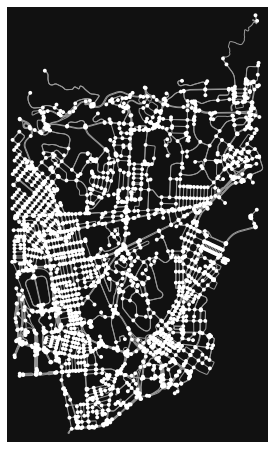

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [5]:
osmnx.plot_graph(graph)

In [6]:
osm_ids = list(graph.nodes)
graph = osmnx.project_graph(graph, to_crs=2326)
gproj = graph.copy()
graph = osmnx.simplification.consolidate_intersections(graph, tolerance=25)
graph = nx.relabel.convert_node_labels_to_integers(graph)
graph.remove_edges_from(nx.selfloop_edges(graph))

parallel_edges = ((u, v) for u, v, k in graph.edges(keys=True) if k > 0)
removable_edges = []

for u, v in set(parallel_edges):
    minlen, _ = min(graph.get_edge_data(u, v).items(), key=lambda x: x[1]["length"])
    removable_edges.extend((u, v, edgelength) for edgelength, _ in graph.get_edge_data(u, v).items() if edgelength != minlen)

graph.remove_edges_from(removable_edges)

edge_keys = list(graph.edges)

osm_id_vals = {k: v for k, v in zip(graph.nodes, osm_ids)}
nx.set_node_attributes(graph, osm_id_vals, "osmid")

nodes, edges = osmnx.graph_to_gdfs(graph, nodes=True, edges=True, node_geometry=True)

i_graph = ig.Graph(directed=True)
i_graph.add_vertices(graph.nodes)
i_graph.add_edges(graph.edges())
i_graph.es["uvk"] = edge_keys
i_graph.es["length"] = list(nx.get_edge_attributes(graph, "length").values())

/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/osmnx/simplification.py:499: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  subcluster_centroid = node_points.loc[wcc].unary_union.centroid
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/osmnx/simplification.py:500: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  gdf.loc[wcc, "x"] = subcluster_centroid.x
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/osmnx/simplification.py:501: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  gdf.loc[wcc, "y"] = subcluster_centroid.y
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/osmnx/simplification.py:503: FutureW

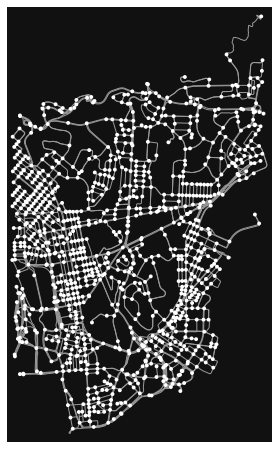

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [7]:
osmnx.plot_graph(graph)

In [8]:
coastline = osmnx.geometries_from_bbox(*bbox, tags={"natural": "coastline"})
# state_boundary = osmnx.geometries_from_bbox(*bbox, tags={"boundary": "administrative", "admin_level": "3"})
coastline.geometry = coastline.geometry.to_crs(2326)

/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarnin

<AxesSubplot:>

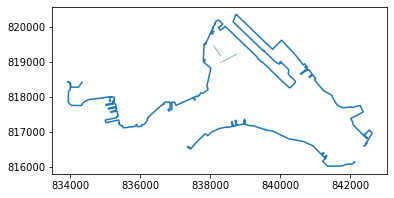

In [9]:
coastline.plot()

In [10]:
nodes, edges = osmnx.graph_to_gdfs(graph, nodes=True, edges=True, node_geometry=True)

In [11]:
edges

osmid  oneway   lanes  \
u    v   key                                                                 
0    1   0                                       102821031    True       2   
     18  0                                       102821102    True       3   
     319 0    [969822200, 969822201, 152073843, 492867823]    True  [2, 1]   
     19  0    [709674296, 709674297, 709674347, 246476284]    True  [4, 3]   
     827 0                  [37664794, 37664795, 37664796]    True       2   
...                                                    ...     ...     ...   
1039 99  0                                       901557028    True       2   
1040 377 0                 [34360971, 34360972, 832492623]    True       2   
1041 524 0                [891030000, 44809931, 240285911]    True       1   
     514 0    [840023057, 937367674, 937367673, 830286645]    True       2   
1042 74  0                                      1067542362   False     NaN   

                                                           name  \
u    v   key                                                      
0    1   0                                      彌敦道 Nathan Road   
     18  0                                 梳士巴利道 Salisbury Road   
     319 0                                      中間道 Middle Road   
     19  0                                 梳士巴利道 Salisbury Road   
     827 0                     梳士巴利道隧道 Salisbury Road Underpass   
...                                                         ...   
1039 99  0                                  雅翔道 Nga Cheung Road   
1040 377 0                                  廣播道 Broadcast Drive   
1041 524 0    [獅子山隧道公路 Lion Rock Tunnel Road, 龍翔道 Lung Cheun...   
     514 0    [獅子山隧道公路 Lion Rock Tunnel Road, 窩打老道 Waterloo ...   
1042 74  0                                                  NaN   

                    highway reversed      length  \
u    v   key                                       
0    1   0          primary    False  155.388522   
     18  0     primary_link    False  247.415013   
     319 0      residential    False  274.012082   
     19  0          primary    False  284.248671   
     827 0          primary    False  518.065066   
...                     ...      ...         ...   
1039 99  0         tertiary    False  234.356031   
1040 377 0         tertiary    False  329.218000   
1041 524 0    motorway_link    False  207.540000   
     514 0         motorway    False  145.474608   
1042 74  0      residential     True   82.818873   

                                                       geometry  u_original  \
u    v   key                                                                  
0    1   0    LINESTRING (835861.573 817315.722, 835798.799 ...    30747332   
     18  0    LINESTRING (835861.573 817315.722, 835926.888 ...   384143738   
     319 0    LINESTRING (835861.573 817315.722, 835926.888 ...   384143738   
     19  0    LINESTRING (835861.573 817315.722, 835812.154 ...   441535168   
     827 0    LINESTRING (835861.573 817315.722, 835862.534 ...  1158360121   
...                                                         ...         ...   
1039 99  0    LINESTRING (834568.088 818499.766, 834570.707 ...  5333519678   
1040 377 0    LINESTRING (836757.042 822367.834, 836740.642 ...  6030773799   
1041 524 0    LINESTRING (836749.257 822922.106, 836758.839 ...  6347429994   
     514 0    LINESTRING (836749.257 822922.106, 836750.000 ...  6347429994   
1042 74  0    LINESTRING (835510.582 818943.748, 835518.781 ...  9801209287   

              v_original  maxspeed tunnel   bridge  ref area junction access  
u    v   key                                                                  
0    1   0    1649047771       NaN    NaN      NaN  NaN  NaN      NaN    NaN  
     18  0    1158360124        50    NaN      NaN  NaN  NaN      NaN    NaN  
     319 0     577560677       NaN    NaN      NaN  NaN  NaN      NaN    NaN  
     19  0     441535437        50    NaN      NaN  NaN  NaN      

In [12]:
sourcex, sourcey = 836151.13, 820010.00

In [13]:
source_node = osmnx.nearest_nodes(graph, X=sourcex, Y=sourcey)

In [14]:
source_node

694

In [15]:
infectious_radius = 2
infectious_nodes = i_graph.neighborhood(source_node, order=infectious_radius, mode="out")

In [16]:
infectious_nodes

[694, 690, 682]

In [17]:
len(infectious_nodes)

3

In [18]:
edges

osmid  oneway   lanes  \
u    v   key                                                                 
0    1   0                                       102821031    True       2   
     18  0                                       102821102    True       3   
     319 0    [969822200, 969822201, 152073843, 492867823]    True  [2, 1]   
     19  0    [709674296, 709674297, 709674347, 246476284]    True  [4, 3]   
     827 0                  [37664794, 37664795, 37664796]    True       2   
...                                                    ...     ...     ...   
1039 99  0                                       901557028    True       2   
1040 377 0                 [34360971, 34360972, 832492623]    True       2   
1041 524 0                [891030000, 44809931, 240285911]    True       1   
     514 0    [840023057, 937367674, 937367673, 830286645]    True       2   
1042 74  0                                      1067542362   False     NaN   

                                                           name  \
u    v   key                                                      
0    1   0                                      彌敦道 Nathan Road   
     18  0                                 梳士巴利道 Salisbury Road   
     319 0                                      中間道 Middle Road   
     19  0                                 梳士巴利道 Salisbury Road   
     827 0                     梳士巴利道隧道 Salisbury Road Underpass   
...                                                         ...   
1039 99  0                                  雅翔道 Nga Cheung Road   
1040 377 0                                  廣播道 Broadcast Drive   
1041 524 0    [獅子山隧道公路 Lion Rock Tunnel Road, 龍翔道 Lung Cheun...   
     514 0    [獅子山隧道公路 Lion Rock Tunnel Road, 窩打老道 Waterloo ...   
1042 74  0                                                  NaN   

                    highway reversed      length  \
u    v   key                                       
0    1   0          primary    False  155.388522   
     18  0     primary_link    False  247.415013   
     319 0      residential    False  274.012082   
     19  0          primary    False  284.248671   
     827 0          primary    False  518.065066   
...                     ...      ...         ...   
1039 99  0         tertiary    False  234.356031   
1040 377 0         tertiary    False  329.218000   
1041 524 0    motorway_link    False  207.540000   
     514 0         motorway    False  145.474608   
1042 74  0      residential     True   82.818873   

                                                       geometry  u_original  \
u    v   key                                                                  
0    1   0    LINESTRING (835861.573 817315.722, 835798.799 ...    30747332   
     18  0    LINESTRING (835861.573 817315.722, 835926.888 ...   384143738   
     319 0    LINESTRING (835861.573 817315.722, 835926.888 ...   384143738   
     19  0    LINESTRING (835861.573 817315.722, 835812.154 ...   441535168   
     827 0    LINESTRING (835861.573 817315.722, 835862.534 ...  1158360121   
...                                                         ...         ...   
1039 99  0    LINESTRING (834568.088 818499.766, 834570.707 ...  5333519678   
1040 377 0    LINESTRING (836757.042 822367.834, 836740.642 ...  6030773799   
1041 524 0    LINESTRING (836749.257 822922.106, 836758.839 ...  6347429994   
     514 0    LINESTRING (836749.257 822922.106, 836750.000 ...  6347429994   
1042 74  0    LINESTRING (835510.582 818943.748, 835518.781 ...  9801209287   

              v_original  maxspeed tunnel   bridge  ref area junction access  
u    v   key                                                                  
0    1   0    1649047771       NaN    NaN      NaN  NaN  NaN      NaN    NaN  
     18  0    1158360124        50    NaN      NaN  NaN  NaN      NaN    NaN  
     319 0     577560677       NaN    NaN      NaN  NaN  NaN      NaN    NaN  
     19  0     441535437        50    NaN      NaN  NaN  NaN      

In [19]:
nodes = nodes.drop("osmid", axis=1)
nodes.geometry = nodes.geometry.to_crs(2326)
nodes = nodes.reset_index()
nodes["is_infectious"] = False
nodes.loc[infectious_nodes, "is_infectious"] = True

/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarnin

<AxesSubplot:>

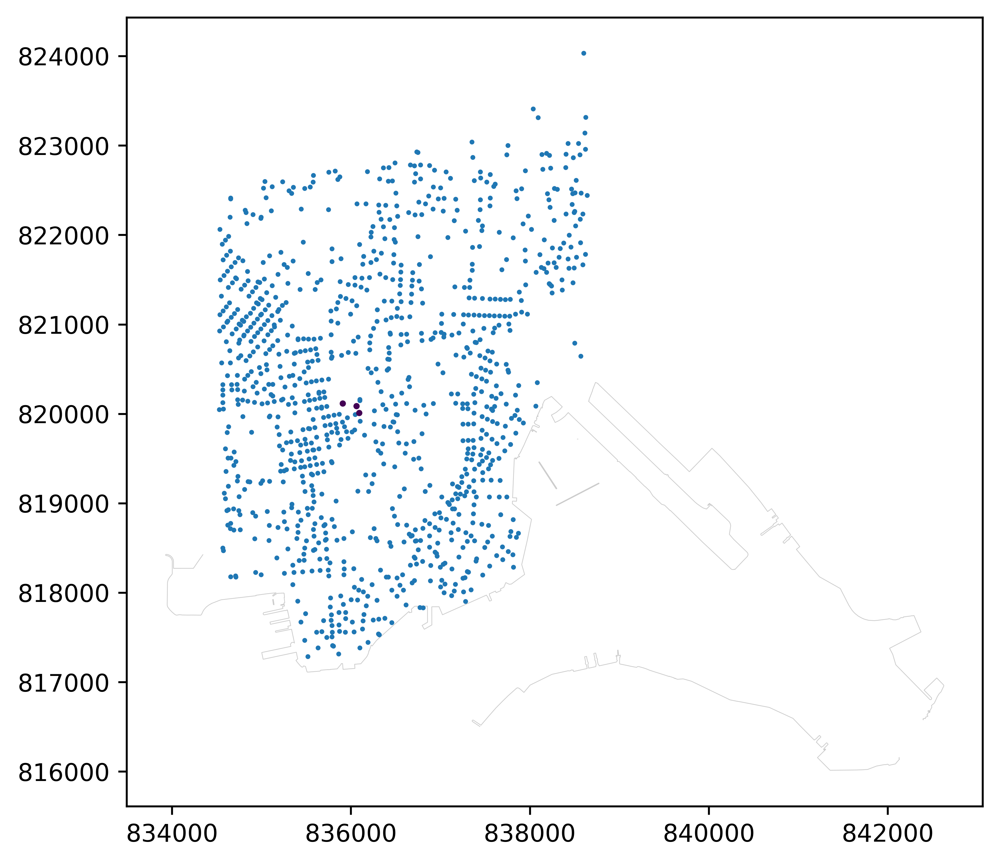

In [30]:
fig = plt.figure(facecolor="w", figsize=(7, 6), dpi=600)
ax = fig.add_subplot(111, axisbelow=True)

coastline.plot(ax=ax, color="k", zorder=1, alpha=0.2, lw=0.3)

nodes[nodes.is_infectious == True].plot("is_infectious", ax=ax, c="k", markersize=2.5, zorder=3)
nodes.plot(ax=ax, zorder=2, markersize=1)


In [31]:
def get_distance(G, source_node, destination_node) -> float:
    return sum(list(map(lambda x: G.es[x]["length"], G.get_shortest_paths(v=source_node, to=destination_node, weights="length", output="epath")[0])))

In [32]:
@np.vectorize
def dnin(G, node) -> float:
    """Distance to the nearest infectious node."""
    distances = []

    for infectious_node in infectious_nodes:
        dist = get_distance(G, source_node=node, destination_node=infectious_node)
        if dist > 0:
            distances.append(dist)
        else:
            distances.append(np.nan)

    return np.min(distances)

In [33]:
nodes["dnin"] = list(map(lambda x: float(dnin(i_graph, x)), range(0, len(nodes))))

/var/folders/1d/97x3559931s0_6hkz64q4zth0000gn/T/ipykernel_30870/3599818022.py:2: RuntimeWarning: Couldn't reach some vertices at src/paths/dijkstra.c:441
  return sum(list(map(lambda x: G.es[x]["length"], G.get_shortest_paths(v=source_node, to=destination_node, weights="length", output="epath")[0])))


In [34]:
nodes

,osmid,osmid_original,x,y,street_count,lon,lat,ref,highway,geometry,is_infectious,dnin
0,0,"[30747332, 1187353031, 384143738, 441535168, 1...",835861.572687,817315.721751,0,NaN,NaN,NaN,NaN,POINT (835861.573 817315.722),False,3250.257067
1,1,1649047771,835792.938749,817410.131292,3,114.172264,22.295615,NaN,NaN,POINT (835792.939 817410.131),False,3201.421758
2,2,30747334,835786.274573,817506.514686,3,114.172200,22.296485,K002,crossing,POINT (835786.275 817506.515),False,3104.409758
3,3,1649047802,835728.661233,817500.348654,3,114.171640,22.296429,NaN,NaN,POINT (835728.661 817500.349),False,3567.984957
4,4,"[1649048114, 1649048105]",835778.840417,817692.127886,0,NaN,NaN,NaN,NaN,POINT (835778.840 817692.128),False,2914.452366
...,...,...,...,...,...,...,...,...,...,...,...,...
1038,1038,5137162816,834712.476129,818174.612157,3,114.161778,22.302518,NaN,NaN,POINT (834712.476 818174.612),False,3301.189982
1039,1039,5333519678,834568.088212,818499.765793,3,114.160377,22.305454,NaN,NaN,POINT (834568.088 818499.766),False,2814.249686
1040,1040,6030773799,836757.042044,822367.833592,3,114.181622,22.340386,NaN,NaN,POINT (836757.042 822367.834),False,3690.576019
1041,1041,6347429994,836749.257451,822922.106321,3,114.181546,22.345391,10B,motorway_junction,POINT (836749.257 822922.106),False,3573.247938


/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarnin

(834000.0, 839000.0)

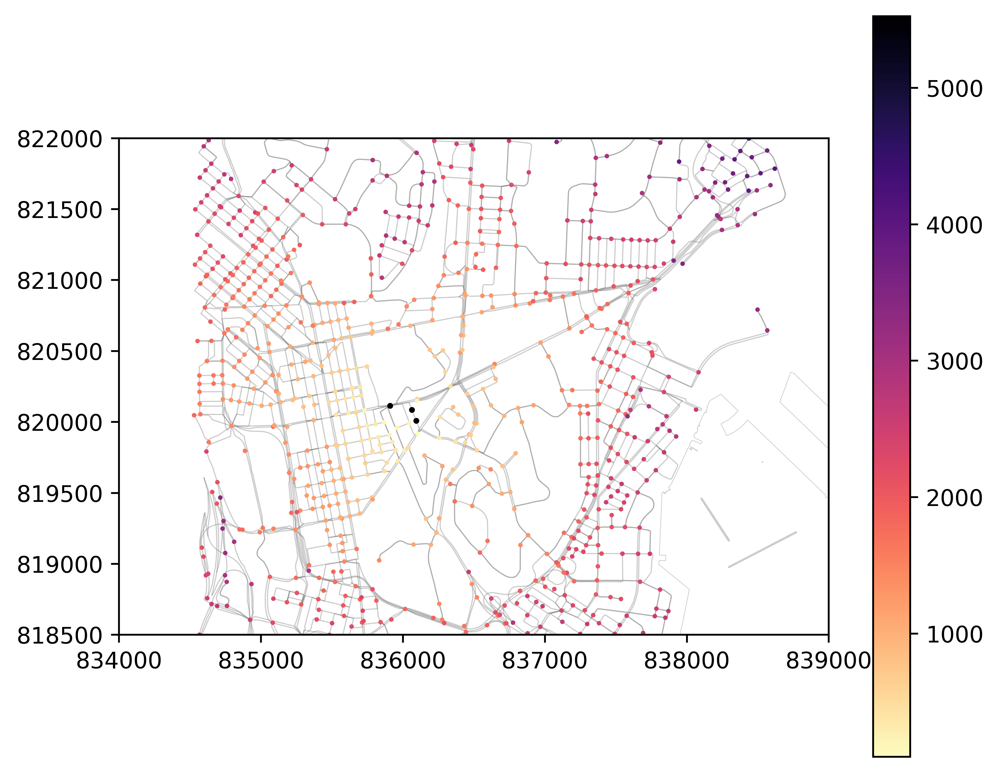

In [35]:
fig = plt.figure(facecolor="w", figsize=(7, 6), dpi=600)
ax = fig.add_subplot(111, axisbelow=True)

pedges = edges.copy()
pedges.geometry = pedges.geometry.to_crs(2326)
pedges.plot(ax=ax, lw=0.5, color='gray', zorder=1, alpha=0.4)

nodes[nodes.is_infectious == True].plot(ax=ax, color="k", markersize=2.5, zorder=3)
nodes[nodes.is_infectious == False].plot("dnin", ax=ax, cmap="magma_r", zorder=2, markersize=1, legend=True)
coastline.plot(ax=ax, color="k", zorder=1, alpha=0.2, lw=0.3)

ax.set_ylim(818500, 822000)
ax.set_xlim(834000, 839000)

In [36]:
def network_infectious_efficiency(G, infectious_subgraph) -> float:
    agg = 0

    for i in range(G.vcount()):
        if i not in infectious_subgraph:
            dist_nin = dnin(G, i)
            if not np.isnan(dist_nin) and dist_nin > 0:
                agg += 1/dist_nin

    return agg

In [37]:
network_infectious_efficiency(i_graph, infectious_nodes)

/var/folders/1d/97x3559931s0_6hkz64q4zth0000gn/T/ipykernel_30870/3599818022.py:2: RuntimeWarning: Couldn't reach some vertices at src/paths/dijkstra.c:441
  return sum(list(map(lambda x: G.es[x]["length"], G.get_shortest_paths(v=source_node, to=destination_node, weights="length", output="epath")[0])))


0.6533842218993784

In [38]:
def delta_efficiency(G):
    base_efficiency = network_infectious_efficiency(G, G.neighborhood(source_node, order=infectious_radius, mode="out"))

    deltas = []

    for edge in tqdm.tqdm(G.es):
        modified_graph = G.copy()
        modified_graph.delete_edges(edge)
        gpeff = network_infectious_efficiency(modified_graph, G.neighborhood(source_node, order=infectious_radius, mode="out"))
        deltas.append((base_efficiency - gpeff)/base_efficiency)

    return deltas

In [39]:
efficiencies = delta_efficiency(i_graph)

/var/folders/1d/97x3559931s0_6hkz64q4zth0000gn/T/ipykernel_30870/3599818022.py:2: RuntimeWarning: Couldn't reach some vertices at src/paths/dijkstra.c:441
  return sum(list(map(lambda x: G.es[x]["length"], G.get_shortest_paths(v=source_node, to=destination_node, weights="length", output="epath")[0])))


  0%|          | 0/2288 [00:00<?, ?it/s]

In [40]:
edges["delta_efficiency"] = efficiencies

/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarnin

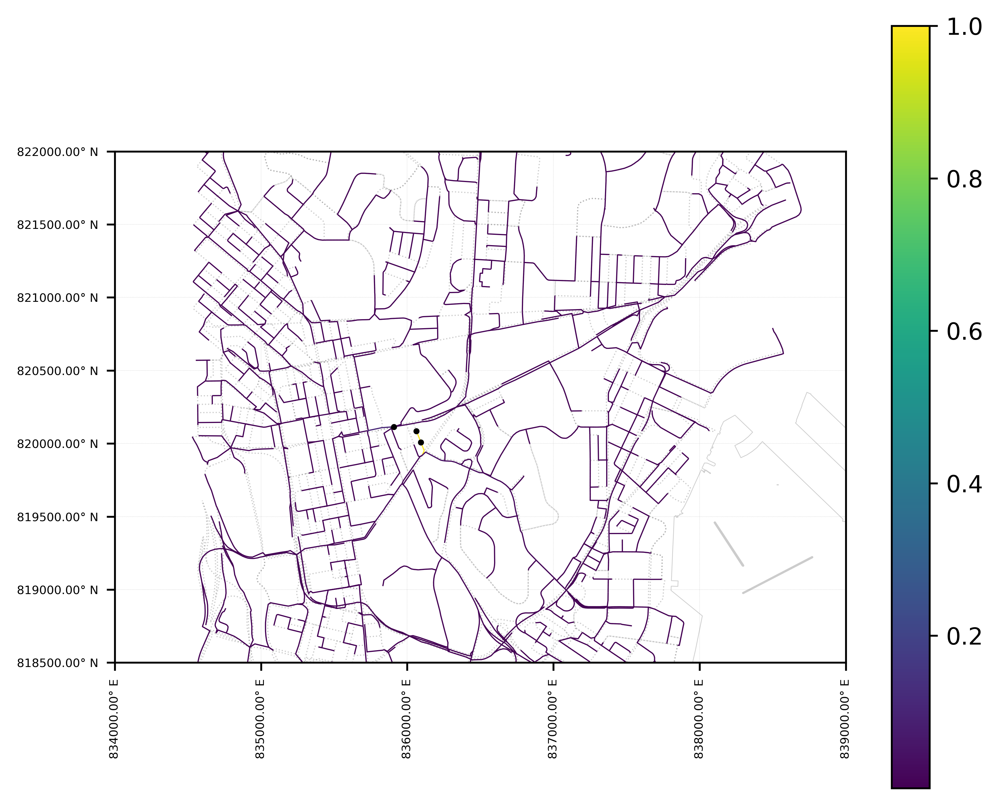

In [41]:
fig = plt.figure(facecolor="w", figsize=(7, 6), dpi=600)
ax = fig.add_subplot(111, axisbelow=True)
edges[edges.delta_efficiency == 0].plot(color="gray", alpha=0.4, ax=ax, lw=0.5, linestyle=":")
edges[edges.delta_efficiency > 0].plot("delta_efficiency", ax=ax, lw=0.5, legend=True, zorder=2)
nodes[nodes.is_infectious == True].plot(ax=ax, color="k", markersize=2.5, zorder=3)
coastline.plot(ax=ax, color="k", zorder=1, alpha=0.2, lw=0.3)

ax.tick_params(axis="x", labelsize=5, rotation=90, grid_alpha=0.2, grid_linewidth=0.2, grid_color="k", grid_linestyle=":")
ax.tick_params(axis="y", labelsize=5, grid_alpha=0.2, grid_linewidth=0.2, grid_color="k", grid_linestyle=":")
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, y: f"{np.abs(x):.2f}° E"))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, y: f"{np.abs(x):.2f}° N"))
ax.grid()

ax.set_ylim(818500, 822000)
ax.set_xlim(834000, 839000)

plt.savefig("graph_interdiction.pdf")

In [42]:
def cascading_interdiction(G, infectious_subgraph, k=3):
    g = G.copy()
    base_efficiency = network_infectious_efficiency(G, G.neighborhood(source_node, order=infectious_radius, mode="out"))

    interdictions = []

    for i in tqdm.trange(k):
        e, Eff = None, 0
        for edge in tqdm.tqdm(g.es):
            modified_graph = g.copy()
            modified_graph.delete_edges(edge)
            gpeff = network_infectious_efficiency(modified_graph, G.neighborhood(source_node, order=infectious_radius, mode="out"))
            if (base_efficiency - gpeff)/base_efficiency > Eff and gpeff > 0:
                e = edge
                Eff = (base_efficiency - gpeff)/base_efficiency

        print(f"Interdiction #{i + 1}: {e} (∆Eff: {Eff})")
        interdictions.append(e.attributes()["uvk"])
        g.delete_edges(e)

    return interdictions, g

In [43]:
res, final_graph = cascading_interdiction(i_graph, infectious_nodes, k=4)

/var/folders/1d/97x3559931s0_6hkz64q4zth0000gn/T/ipykernel_30870/3599818022.py:2: RuntimeWarning: Couldn't reach some vertices at src/paths/dijkstra.c:441
  return sum(list(map(lambda x: G.es[x]["length"], G.get_shortest_paths(v=source_node, to=destination_node, weights="length", output="epath")[0])))


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2288 [00:00<?, ?it/s]

Interdiction #1: igraph.Edge(<igraph.Graph object at 0x167bfe980>, 1575, {'uvk': (685, 682, 0), 'length': 185.12745715412316}) (∆Eff: 0.10638487050790796)


  0%|          | 0/2287 [00:00<?, ?it/s]

Interdiction #2: igraph.Edge(<igraph.Graph object at 0x167bfe980>, 154, {'uvk': (53, 792, 0), 'length': 79.096}) (∆Eff: 0.162013026632201)


  0%|          | 0/2286 [00:00<?, ?it/s]

Interdiction #3: igraph.Edge(<igraph.Graph object at 0x167bfe980>, 1549, {'uvk': (676, 675, 0), 'length': 182.945198938286}) (∆Eff: 0.20131308893098626)


  0%|          | 0/2285 [00:00<?, ?it/s]

Interdiction #4: igraph.Edge(<igraph.Graph object at 0x167bfe980>, 1840, {'uvk': (813, 51, 0), 'length': 262.4988351857957}) (∆Eff: 0.23695739581596886)


In [44]:
def nxdnin(G, n, infectious):
    dists = []
    for i in infectious:
        try:
            dist = nx.shortest_path_length(G, n, i, weight="length")
            dists.append(dist)
        except nx.NetworkXNoPath:
            dists.append(np.nan)

    return min(dists)

In [45]:
ngn, nge = nodes, edges.loc[set(edges.index) - set(res)]

/var/folders/1d/97x3559931s0_6hkz64q4zth0000gn/T/ipykernel_30870/584937977.py:1: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ngn, nge = nodes, edges.loc[set(edges.index) - set(res)]


In [46]:
new_graph = osmnx.graph_from_gdfs(ngn, nge)

In [47]:

new_graph = osmnx.graph_from_gdfs(ngn, nge)
infected = final_graph.neighborhood(source_node, order=infectious_radius, mode="out")

ngn.dnin = list(map(lambda x: nxdnin(new_graph, x, infected), list(ngn.index)))

In [51]:
interdictions

,,,osmid,oneway,lanes,name,highway,reversed,length,geometry,u_original,v_original,maxspeed,tunnel,bridge,ref,area,junction,access,delta_efficiency
u,v,key,,,,,,,,,,,,,,,,,,
685,682,0,258741146,True,3,亞皆老街 Argyle Street,primary,False,185.127457,POINT (114.17251 22.31994),2639744193,1162875771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.106385
53,792,0,435421062,True,3,山東街 Shantung Street,tertiary,False,79.096000,POINT (114.17298 22.31810),1107287994,1636543631,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.009198
676,675,0,53410825,True,3,培正道 Pui Ching Road,secondary,False,182.945199,POINT (114.17601 22.31820),804108014,804106924,50,NaN,NaN,NaN,NaN,NaN,NaN,0.039300
813,51,0,102640432,True,3,窩打老道 Waterloo Road,primary,False,262.498835,POINT (114.17286 22.31514),1151084846,1151084896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.013891


/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting.py:74: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if mpl >= LooseVersion("3.4") or (mpl > LooseVersion("3.3.2") and "+" in mpl):
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/geopandas/plotting

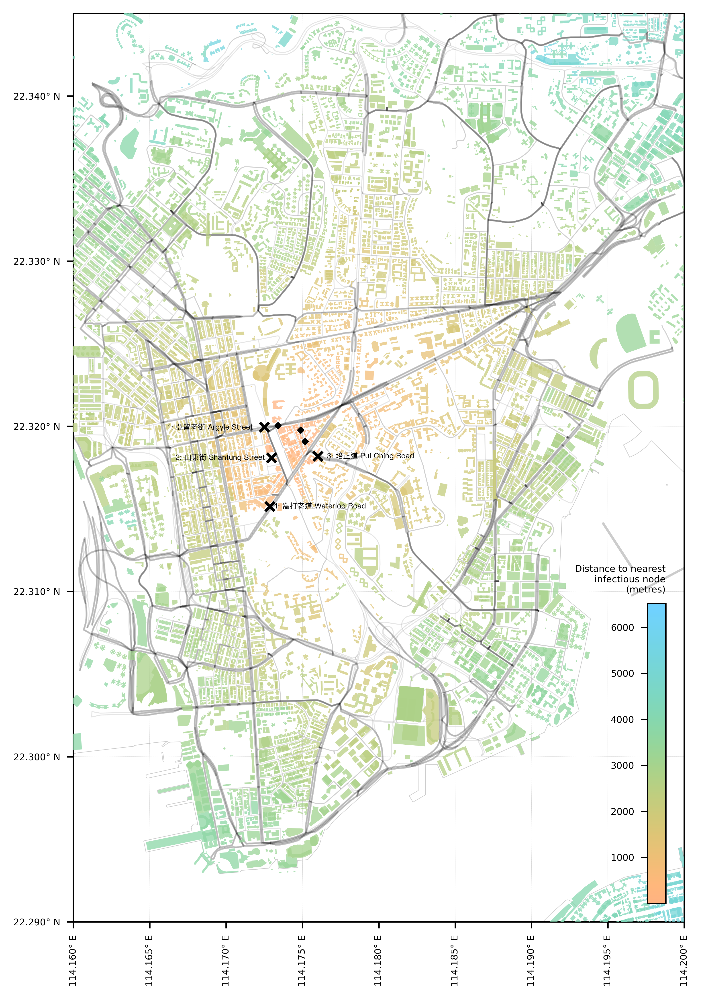

In [76]:
fig = plt.figure(facecolor="w", figsize=(6, 9), dpi=600)
ax = fig.add_subplot(111, axisbelow=True)

interdictions = edges.loc[res, :]
interdictions.geometry = interdictions.geometry.to_crs(4326)
interdictions.geometry = interdictions.apply(lambda x: x.geometry.centroid, axis=1)
interdictions.geometry = interdictions.geometry.to_crs(4326)
interdictions.plot(ax=ax, markersize=25, zorder=11, marker="x", c="k")

for idx, row in enumerate(interdictions.iterrows()):
    if idx >= 2:
        ax.annotate(text=f"{idx + 1}: {row[1][3]}", xy = (row[1].geometry.x + 0.0063, row[1].geometry.y), xycoords="data", fontname="PingFang HK", horizontalalignment="right", verticalalignment="center", fontsize=4, zorder=20)
    else:
        ax.annotate(text=f"{idx + 1}: {row[1][3]}", xy = (row[1].geometry.x - 0.0063, row[1].geometry.y), xycoords="data", fontname="PingFang HK", horizontalalignment="left", verticalalignment="center", fontsize=4, zorder=20)


#ngn[ngn.is_infectious == False].plot("dnin", ax=ax, cmap="inferno_r", markersize=3.25, legend=True, zorder=7)

edges.geometry = edges.geometry.to_crs(4326)
edges.plot(color="gray", ax=ax, lw=0.5, zorder=2, alpha=0.2)
edges[edges.highway.isin(["motorway", "primary", "primary_link", "secondary"])].plot(color="k", ax=ax, lw=1, zorder=3, alpha=0.2)

nodes.geometry = nodes.geometry.to_crs(4326)
nodes[nodes.is_infectious == True].plot(ax=ax, color="k", markersize=4, zorder=13, marker="D", alpha=1)

coastline.geometry = coastline.geometry.to_crs(4326)
coastline.plot(ax=ax, color="k", zorder=1, alpha=0.2, lw=0.3)

footprints = osmnx.geometries_from_bbox(*bbox, tags={"building": True})
footprints.geometry = footprints.geometry.to_crs(2326)
nodes.geometry = nodes.geometry.to_crs(2326)
footprints = footprints[footprints.geom_type != "Point"]
footprints = footprints.sjoin_nearest(nodes, how="left", distance_col="dtnn")
footprints = footprints[["geometry", "dnin", "dtnn"]]
footprints["distance"] = footprints.dnin + footprints.dtnn
footprints.geometry = footprints.geometry.to_crs(4326)
footprints.plot("distance", ax=ax, cmap=cc.cm.isolum_r, alpha=0.75, legend=False, zorder=9)

ax.tick_params(axis="x", labelsize=5, rotation=90, grid_alpha=0.2, grid_linewidth=0.2, grid_color="k", grid_linestyle=":")
ax.tick_params(axis="y", labelsize=5, grid_alpha=0.2, grid_linewidth=0.2, grid_color="k", grid_linestyle=":")
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, y: f"{np.abs(x):.3f}° E"))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, y: f"{np.abs(x):.3f}° N"))
ax.grid()
ax.set_ylim(bbox[0], 22.345)
ax.set_xlim(bbox[2], bbox[3])

axins = inset_axes(ax, width="3%", height="33%", loc="lower right", borderpad=1)
norm = colors.Normalize(vmin=footprints["distance"].min(), vmax=footprints["distance"].max())
cbar = plt.cm.ScalarMappable(norm=norm, cmap=cc.cm.isolum_r)
ax_cbar = fig.colorbar(cbar, cax=axins)
axins.yaxis.set_ticks_position("left")
axins.tick_params(axis="y", labelsize=5)
axins.set_title("Distance to nearest\ninfectious node\n(metres)", loc="right")

plt.savefig("graph_interdiction.pdf")